# >>>>>>>>>>>>>>>>>>>>>>>>>>Decision Tree<<<<<<<<<<<<<<<<<<<<<<<

Decision tree algorithm is one of the most versatile algorithms in machine learning which can perform both classification and regression analysis. It is very powerful and works great with complex datasets. Apart from that, it is very easy to understand and read. That makes it more popular to use. When coupled with ensemble techniques - which we will learn very soon- it performs even better. As the name suggests, this algorithm works by dividing the whole dataset into a tree-like structure based on some rules and conditions and then gives prediction based on those conditions. Let's understand the approach to decision tree with a basic scenario. Suppose it's Friday night and you are not able to decide if you should go out or stay at home. Let the decision tree decide it for you.
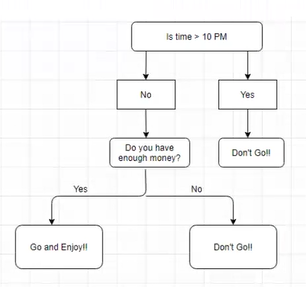
Although we may or may not use the decision tree for such decisions, this was a basic example to help you understand how a decision tree makes a decision. So how did it work?

* It selects a root node based on a given condition, e.g. our root node was chosen as time >10 pm.
* Then, the root node was split into child notes based on the given condition. The right child node in the above figure
fulfilled the condition, so no more questions were asked.
* The left child node didn't fulfil the condition, so again it was split based on a new condition!
* This process continues till all the conditions are met or if you have predefined the depth of your tree, e.g. the depth of our tree is 3, and it reached there when all the conditions were exhausted.

# Tree Pruning
Tree pruning is the method of trimming down a full tree (obtained through the above process) to reduce the complexity and variance in the data. Just as we regularised linear regression, we can also regularise the decision tree model by adding a new term.
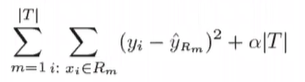
Where, T is the subtree which is a subset of the full tree TO And a is the non-negative tuning parameter which penalises the MSE with an increase in tree length. By using cross-validation, such values of a and T are selected for which our model gives the lowest test error rate. This is how the decision tree regression model works. Let's now see the working algorithm of doing classification using a decision tree. Greedy Algorithm As per Hands-on machine learning book "greedy algorithm greedily searches for an optimum split at the top level, then repeats the process at each level. It does not check whether or not the split will lead to the lowest possible impurity several levels down. A greedy algorithm often produces a reasonably good solution, but it is not guaranted to be the optimal solution".

### Post-pruning
Post-pruning, also known as backward pruning, is the process where the decision tree is generated first and then the non- significant branches are removed. Cross-validation set of data is used to check the effect of pruning and tests whether expanding a node will make an improvement or not. If any improvement is there then we continue by expanding that node else if there is reduction in accuracy then the node not be expanded and should be converted in a leaf node.

### Pre-pruning
Pre-pruning, also known as forward pruning, stops the non-significant branches from generating. It uses a condition to decide when should it terminate splitting of some of the branches prematurely as the tree is generated.

# Classification Trees
Regression trees are used for quantitative data. In the case of qualitative data or categorical data, we use classification trees. In regression trees, we split the nodes based on RSS criteria, but in classification, it is done using classification error rate, Gini impurity and entropy. Let's understand these terms in detail.

# Entropy

Entropy is the measure of randomness in the data. In other words, it gives the impurity present in the dataset.
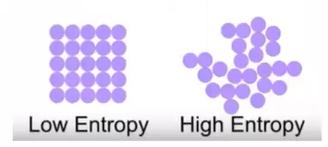
When we split our nodes into two regions and put different observations in both the regions, the main goal is to reduce the entropy i.e. reduce the randomness in the region and divide our data cleanly than it was in the previous node. If splitting the node doesn't lead into entropy reduction, we try to split based on a different condition, or we stop. A region is clean (low entropy) when it contains data with the same labels and random if there is a mixture of labels present (high entropy). Let's suppose there are 'm' observations and we need to classify them into categories 1 and 2. Let's say that category 1 has 'n' observations and category 2 has 'm-n' observations.

p=n/m and q = m-n/m = 1-p

then, entropy for the given set is:

###### entropy = Σ -p * log2(p)

When all the observations belong to category 1, then p = 1 and all observations belong to category 2, then p =0, int both cases E =0, as there is no randomness in the categories. If half of the observations are in category 1 and another half in category 2, then p=1/2 and q =1/2, and the entropy is maximum, E =1.
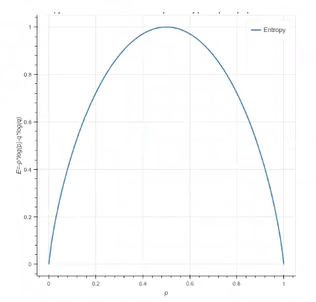

#### Information Gain

Information gain calculates the decrease in entropy after splitting a node. It is the difference between entropies before and after the split. The more the information gain, the more entropy is removed.

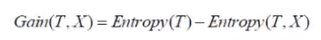

Where, T is the parent node before split and X is the split node from T.

A tree which is splitted on basis of entropy and information gain value looks like:


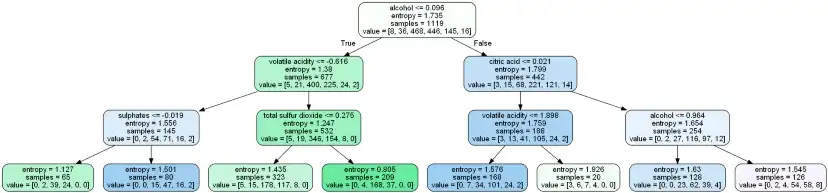

# Gini Impurity
According to wikipedia, 'Gini impurity is a measure of how often a randomly chosen element from the set would be incorrectly labelled if it was randomly labelled according to the distribution of labels in the subset.' It is calculated by multiplying the probability that a given observation is classified into the correct class and sum of all the probabilities when that particular observation is classified into the wrong class.

Ginni impurity value lies between 0 and 1, 0 being no impurity and 1 denoting random distribution. The node for which the Ginni impurity is least is selected as the root node to split.

A tree which is splitted on basis of ginni impurity value looks like:
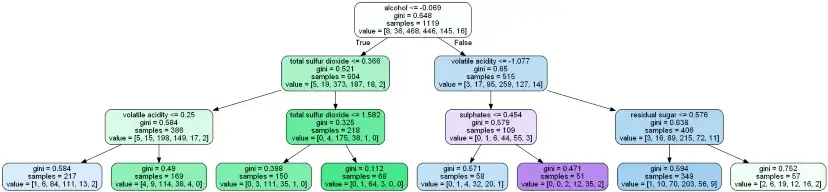

### Entropy and Gini
Entropy and Gini impurity can be used reversibly. It doesn’t affects the result much. Although, gini is easier to compute than entropy, since entropy has a log term calculation. That’s why CART algorithm uses gini as the default algorithm.

If we plot gini vs entropy graph, we can see there is not much difference between them:


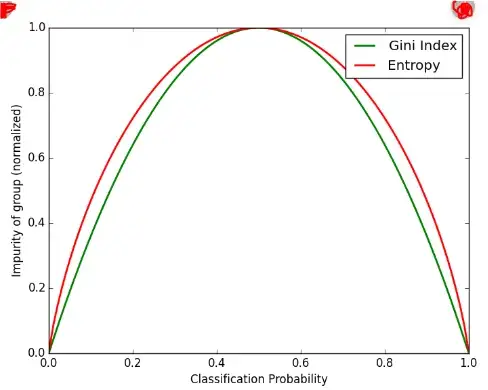
**Advantages of Decision Tree:**

It can be used for both Regression and Classification problems.
Decision Trees are very easy to grasp as the rules of splitting is clearly mentioned.
Complex decision tree models are very simple when visualized. It can be understood just by visualizing.
Scaling and normalization are not needed.

**Disadvantages of Decision Tree:**

A small change in data can cause instability in the model because of the greedy approach.
Probability of overfitting is very high for Decision Trees.
It takes more time to train a decision tree model than other classification algorithms.

### Different Algorithms for Decision Tree

* ID3 (Iterative Dichotomiser): It is one of the algorithms used to construct decision tree for classification. It uses Information gain as the criteria for finding the root nodes and splitting them. It only accepts categorical attributes.

* C4.5: It is an extension of ID3 algorithm, and better than ID3 as it deals both continuous and discreet values.It is also used for classfication purposes.

* Classfication and Regression Algorithm (CART): It is the most popular algorithm used for constructing decison trees. It uses ginni impurity as the default calculation for selecting root nodes, however one can use "entropy" for criteria as well. This algorithm works on both regression as well as classfication problems. We will use this algorithm in our pyhton implementation.

## Implementation in Python
we will use Sklearn module to implement decision tree algorithm. Sklearn uses CART (classification and Regression trees) algorithm and by default it uses Gini impurity as a criteria to split the nodes.

There are other algorithms like ID3, C4.5, Chi-square etc.

We will see the use of CART in following implementation.

In [3]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [4]:
data = pd.read_csv("wine.csv")
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Alcohol_content,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,Low,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,Medium,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,Medium,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,Medium,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,Low,5


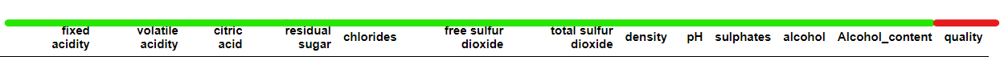
**Green = Feature**

**Red = Label**

In [5]:
data.shape  # 13 = columns and 1599 = rows

(1599, 13)

In [6]:
# Any missing values?

data.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
Alcohol_content         0
quality                 0
dtype: int64

In [7]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


**As we have categorical column (Alcohol_content), we need to convert into numeric data using encoding method.**

Content is following some order like Low, Med and High. We need to give weight according to the order.

In [8]:
from sklearn.preprocessing import OrdinalEncoder

ord_encoder = OrdinalEncoder(categories=[['Low','Medium','High']])

df1 = ord_encoder.fit_transform(data[['Alcohol_content']])
df1

array([[0.],
       [1.],
       [1.],
       ...,
       [2.],
       [1.],
       [2.]])

In [9]:
data['Alcohol_content'] = df1
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Alcohol_content,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0.0,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,1.0,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,1.0,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,1.0,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0.0,5


## Plotting Heatmap (Correlation matrix)

- Let's try to see if we can reduce the feature using different techniques
- Let's plot heatmap to visualize and find the coefficient of multicollinearity

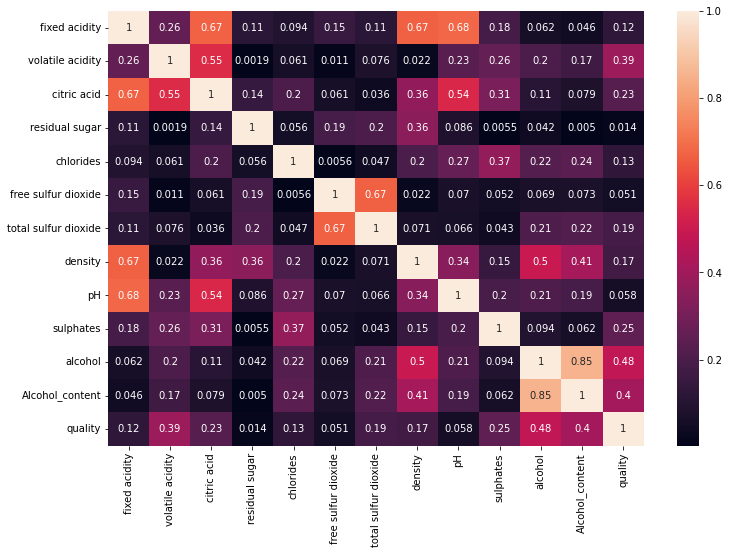

In [10]:
df_corr = data.corr().abs() # This code will get the coefficient of one variable vs all other variable

plt.figure(figsize=(12,8))
sns.heatmap(df_corr, annot=True, annot_kws={'size':10})
plt.show()

Seem like Alcohol_content and alcohol are correlated as per above heat map. But we need more proof.

### Make sure they are really correlated (It should follow some trend)

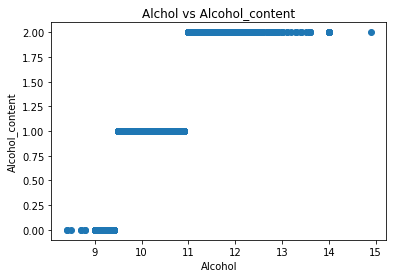

In [11]:
plt.scatter(data.alcohol, data.Alcohol_content)
plt.xlabel('Alcohol')
plt.ylabel('Alcohol_content')
plt.title('Alchol vs Alcohol_content')
plt.show()

In [12]:
x = data.drop(columns = ['quality','Alcohol_content'])
y = data['quality']

In [13]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.25, random_state = 41)

In [14]:
# Write one function and call as many as times to check accuracy_score of different models

def metric_score(clf, x_train,x_test,y_train,y_test,train=True):
    if train:
        y_pred = clf.predict(x_train)
        
        print("\n====================Train Result===================")
        print(f"Accuracy Score: {accuracy_score(y_train, y_pred) * 100:.2f}%")
        
    elif train==False:
        pred = clf.predict(x_test)
        
        print("\n=====================Test Result===================")
        print(f"Accuracy Score: {accuracy_score(y_test,pred) * 100:.2f}%")
        
        print ('\n \n Test Classification Report \n', classification_report(y_test, pred,digits=2))

In [15]:
# Model initiation

clf = DecisionTreeClassifier()
clf.fit(x_train,y_train)

DecisionTreeClassifier()

In [16]:
# Call the function and pass dataset to check train and test score

metric_score(clf,x_train,x_test,y_train,y_test,train=True) # This is for training score

metric_score(clf,x_train,x_test,y_train,y_test=False)  # This is for testing score


====================Train Result===================
Accuracy Score: 100.00%

====================Train Result===================
Accuracy Score: 100.00%


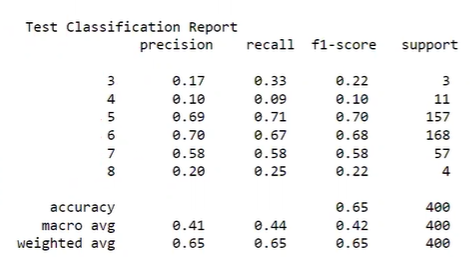

### Let's see how the tree looks like (This is nothing to do with algorithm/accuracy).It's just for visualization purpose.

In [17]:
feature_name = list(x.columns)
class_name = list(y_train.unique())
feature_name

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol']

In [18]:
import graphviz
from sklearn.tree import export_graphviz
from sklearn import tree
from IPython.display import Image
import pydotplus

# Create a dot_file which stores the tree structure
dot_data = export_graphviz(clf,feature_names = feature_name,rounded = True, filled = True)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)
graph.write_png("myTree.png")

#show graph
Image(graph.create_png())


(process:17672): GLib-GIO-WARNING **: 20:41:38.898: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.15.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs


(process:18180): GLib-GIO-WARNING **: 20:41:41.819: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.15.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs



###### In order to run above code, I need to install some required files, & versions.

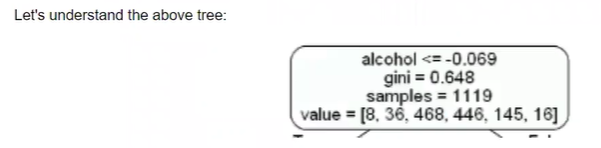

- the first value indicates the column and the condition on which the root node was selected and further will be splitted 
- the second value gives the gini impurity of the selected node
- samples gives the number of observations at that point of time present in the node
- value within the square brackets represents number of observations present in each class(output) i.e. in the above given figure, 8 observations are in class 1, 38 in class 2, 468 in class 3 and so on.

Then the split was made on the basis of given condition.

### Model confidence/accuracy

**Let's now try to tune some hyperparameters using the GridSearchCV algorithm.**

**GridSearchCV is a method used to tune our hyperparameters. We can pass different values of hyperparameters as parameters for grid search. It does a exhaustive generation of combination of different parameters passed. Using cross validation score, Grid Search returns the combination of hyperparameters for which the model is performing the best.**

### What are hyper parameters?

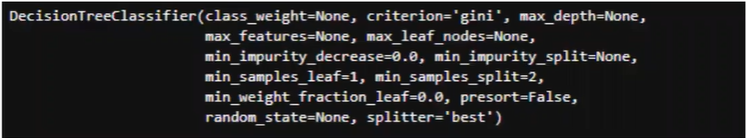

**We can see above the decision tree classifier algorithm takes all those parameters which are also known as hyperparameters.
Let's see the most important ones of the parameters (as per sklearn documentation):**

##### Parameters

- criterion : string, optional (default="gini")

    The function to measure the quality of a split. Supported criteria are "gini" for the Gini impurity and "entropy" for the information gain.

- splitter : string, optional (default="best") The strategy used to choose the split at each node. Supported strategies are "best" to choose the best split and "random" to choose the best random split.
- max_depth : int or None, optional (default=None) The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
- min_samples_split: int, float, optional (default=2) The minimum number of samples required to split an internal node:

    - If int, then consider min_samples_split as the minimum number.
    - If float, then min_samples_split is a fraction and ceil(min_samples_split * n_samples) are the minimum number of samples for each split.


.. versionchanged:: 0.18 Added float values for fractions.
 
- min_samples_leaf: int, float, optional (default=1) The minimum number of samples required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches. This may have the effect of smoothing the model, especially in regression. 

    - If int, then consider min_samples_leaf as the minimum number.
    - If float, then min_samples_leaf is a fraction and ceil(min_samples_leaf * n_samples) are the minimum number of samples for each node.

- max_features: int, float, string or None, optional (default=None) The number of features to consider when looking for the best split:
    - If int, then consider `max_features features at each split.
    - If float, then `max_features is a fraction and
    `int(max_features n_features) features are considered at each

 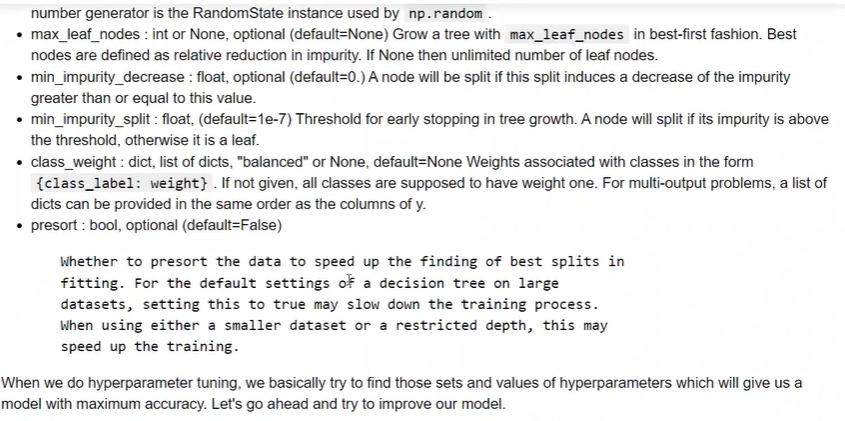

In [19]:
# We are tuning four important hyperparameters right now, we are passing the different values for both 

grid_param = {
    'criterion': ['gini', 'entropy'], 
    'max_depth': range(10,15),            # The maximum depth of the tree.
    'min_samples_leaf': range(2,6),      # The minimum number of samples required to be at a leaf node
    'min_samples_split': range(3,8),          # The minimum number of samples required to split an internal node
    'max_leaf_nodes': range(5,10)      # Best nodes are defined as relative reduction in impurity. If None then unlimited number of leaf nodes.
}

In [20]:
grid_search = GridSearchCV(estimator= clf,
                     param_grid= grid_param,
                     cv= 5,
                     n_jobs = -1)  #Use all the cores in your system. For performance improvement.

In [21]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(10, 15),
                         'max_leaf_nodes': range(5, 10),
                         'min_samples_leaf': range(2, 6),
                         'min_samples_split': range(3, 8)})

In [22]:
best_parameters = grid_search.best_params_
print(best_parameters)

{'criterion': 'entropy', 'max_depth': 10, 'max_leaf_nodes': 7, 'min_samples_leaf': 2, 'min_samples_split': 3}


In [23]:
# Initiate DecisionTreeClassifier with new parameters and train

clf = DecisionTreeClassifier(criterion = 'entropy', min_samples_split =3, max_depth= 12, min_samples_leaf= 2)

# Train the model

clf.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=12, min_samples_leaf=2,
                       min_samples_split=3)

In [25]:
# Call the function and pass dataset to check train and test score

metric_score(clf,x_train,x_test,y_train,y_test,train=True)  # This is for training score.

metric_score(clf,x_train,x_test,y_train,y_test,train=False) # This is for testing score


====================Train Result===================
Accuracy Score: 92.58%

=====================Test Result===================
Accuracy Score: 58.50%

 
 Test Classification Report 
               precision    recall  f1-score   support

           3       0.14      0.33      0.20         3
           4       0.16      0.27      0.20        11
           5       0.63      0.70      0.66       157
           6       0.62      0.57      0.59       168
           7       0.57      0.42      0.48        57
           8       0.25      0.25      0.25         4

    accuracy                           0.58       400
   macro avg       0.40      0.42      0.40       400
weighted avg       0.60      0.58      0.59       400



## Please Note- When you tune all the parameters there is a very good chance that, you can improve the accuracy.
**Since Other parameters are default, this combination is not giving better result. You can play around with other numbers to improve the accuracy.**

Let's visualize the final tree:


(process:14524): GLib-GIO-WARNING **: 20:47:24.227: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.15.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs


(process:8204): GLib-GIO-WARNING **: 20:47:25.974: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.15.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs



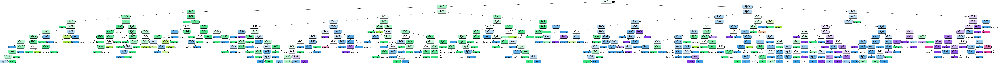

In [27]:
feature_name=list(x.columns)
class_name = list(y_train.unique())
# create a dot_file which stores the tree structure
dot_data = export_graphviz (clf, rounded = True, filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)
graph.write_png ("tree_hype.png")
# Show graph
Image(graph.create_png())